# Assignment From Week 1

In [323]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
import statsmodels as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.metrics import r2_score,mean_squared_error
from sklearn import preprocessing
import sklearn

In [316]:
df = pd.read_csv('application_train.csv')

In [317]:
df.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

In [318]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
#Top ten variables including target variable
tv_df = df[['TARGET','NAME_HOUSING_TYPE', 'CNT_CHILDREN','NAME_TYPE_SUITE','NAME_FAMILY_STATUS','REGION_POPULATION_RELATIVE','CODE_GENDER','DAYS_EMPLOYED','OCCUPATION_TYPE','APARTMENTS_AVG','AMT_INCOME_TOTAL']]
tv_df.dropna(0, inplace = True)
tv_df.head()

,TARGET,NAME_HOUSING_TYPE,CNT_CHILDREN,NAME_TYPE_SUITE,NAME_FAMILY_STATUS,REGION_POPULATION_RELATIVE,CODE_GENDER,DAYS_EMPLOYED,OCCUPATION_TYPE,APARTMENTS_AVG,AMT_INCOME_TOTAL
0,1,House / apartment,0,Unaccompanied,Single / not married,0.018801,M,-637,Laborers,0.0247,202500.0
1,0,House / apartment,0,Family,Married,0.003541,F,-1188,Core staff,0.0959,270000.0
2,0,House / apartment,0,Unaccompanied,Single / not married,0.010032,M,-225,Laborers,0.0000,67500.0
3,0,House / apartment,0,Unaccompanied,Civil marriage,0.008019,F,-3039,Laborers,0.0000,135000.0
4,0,House / apartment,0,Unaccompanied,Single / not married,0.028663,M,-3038,Core staff,0.0000,121500.0


In [33]:
tv_df.dtypes

TARGET                          int64
NAME_HOUSING_TYPE              object
CNT_CHILDREN                    int64
NAME_TYPE_SUITE                object
NAME_FAMILY_STATUS             object
REGION_POPULATION_RELATIVE    float64
CODE_GENDER                    object
DAYS_EMPLOYED                   int64
OCCUPATION_TYPE                object
APARTMENTS_AVG                float64
AMT_INCOME_TOTAL              float64
dtype: object

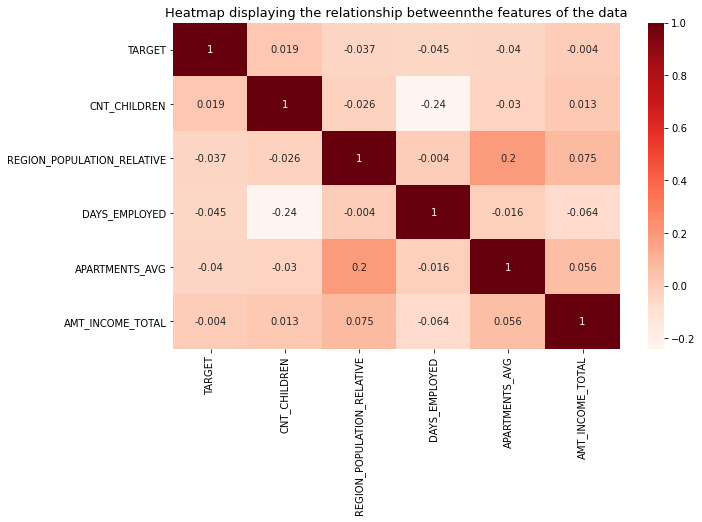

In [34]:
plt.figure(figsize=(10,6))
sns.heatmap(tv_df.corr(),cmap=plt.cm.Reds,annot=True)
plt.title('Heatmap displaying the relationship betweennthe features of the data',
         fontsize=13)
plt.show()

Text(0.5, 1.0, 'Difficulty with payments with Children')

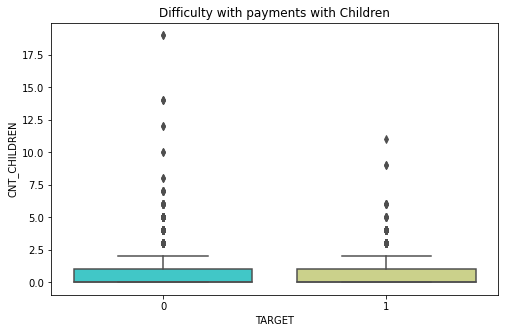

In [100]:
plt.figure(figsize=(8,5))
sns.boxplot(x=tv_df['TARGET'],y= tv_df['CNT_CHILDREN'],data=tv_df, palette='rainbow')
plt.title("Difficulty with payments with Children")

Text(0.5, 1.0, 'Violin Plot of Days employed by gender, Separated by payment difficulties')

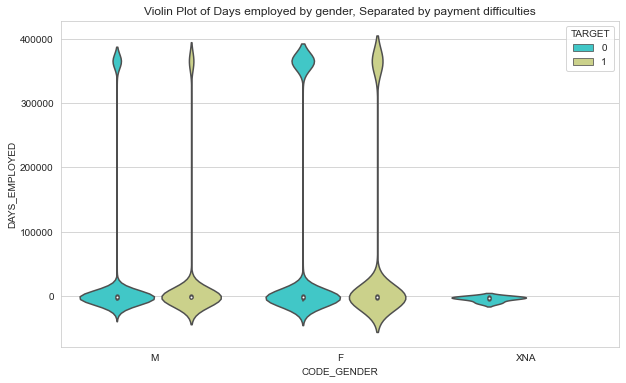

In [109]:
plt.figure(figsize=(10,6))
sns.violinplot(x=tv_df['CODE_GENDER'],y=tv_df["DAYS_EMPLOYED"],data=tv_df, hue=tv_df['TARGET'], palette='rainbow')
plt.title("Violin Plot of Days employed by gender, Separated by payment difficulties")

Text(0.5, 1.0, 'region population by payment difficulties, divided by occupation type')

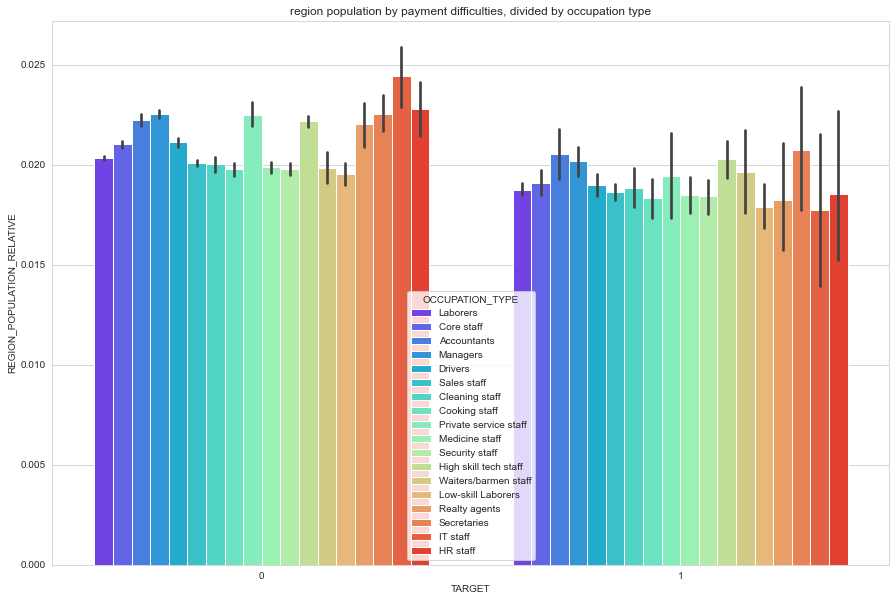

In [135]:
plt.figure(figsize=(15,10))
sns.barplot(x=tv_df['TARGET'],y=tv_df['REGION_POPULATION_RELATIVE'],data=tv_df, palette='rainbow', hue='OCCUPATION_TYPE')
plt.title("region population by payment difficulties, divided by occupation type")

Text(0.5, 1.0, 'income by payment difficulties, divided by Occupation type')

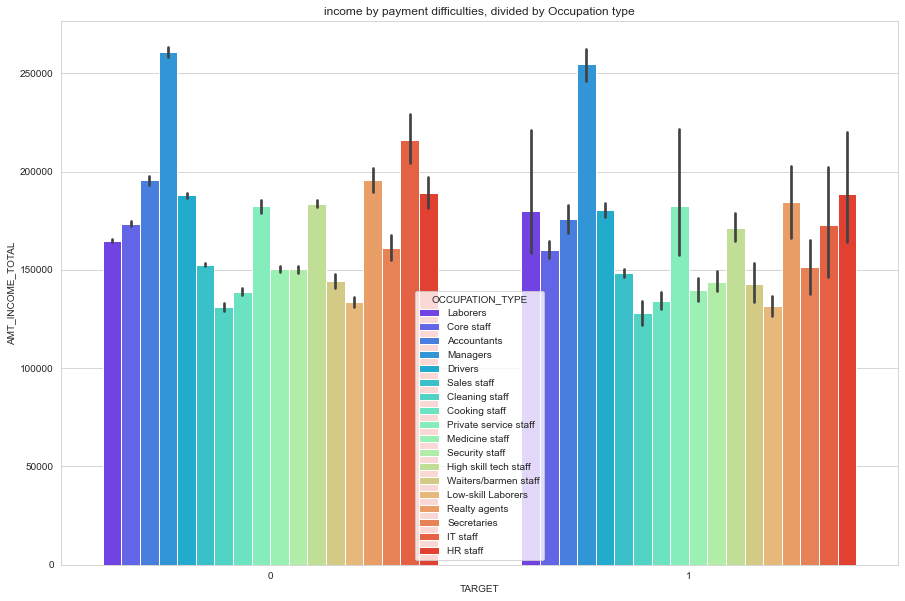

In [134]:
plt.figure(figsize=(15,10))
sns.barplot(x=tv_df['TARGET'],y=tv_df['AMT_INCOME_TOTAL'],data=tv_df, palette='rainbow', hue='OCCUPATION_TYPE')
plt.title("income by payment difficulties, divided by Occupation type")

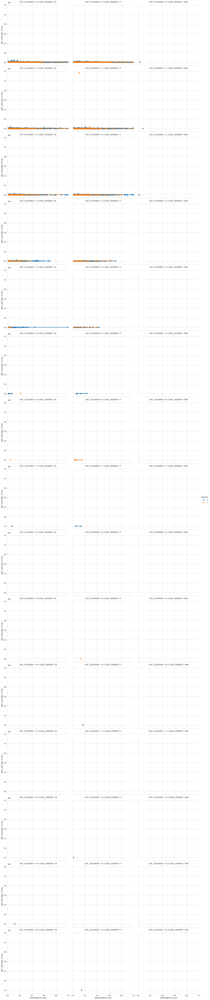

In [128]:
sns.lmplot(x ='APARTMENTS_AVG', y ='AMT_INCOME_TOTAL', data = tv_df, 
           col ='CODE_GENDER', row ='CNT_CHILDREN', hue ='TARGET')

Text(0.5, 1.0, 'Apartments average size by payment difficulties, divided by Gender')

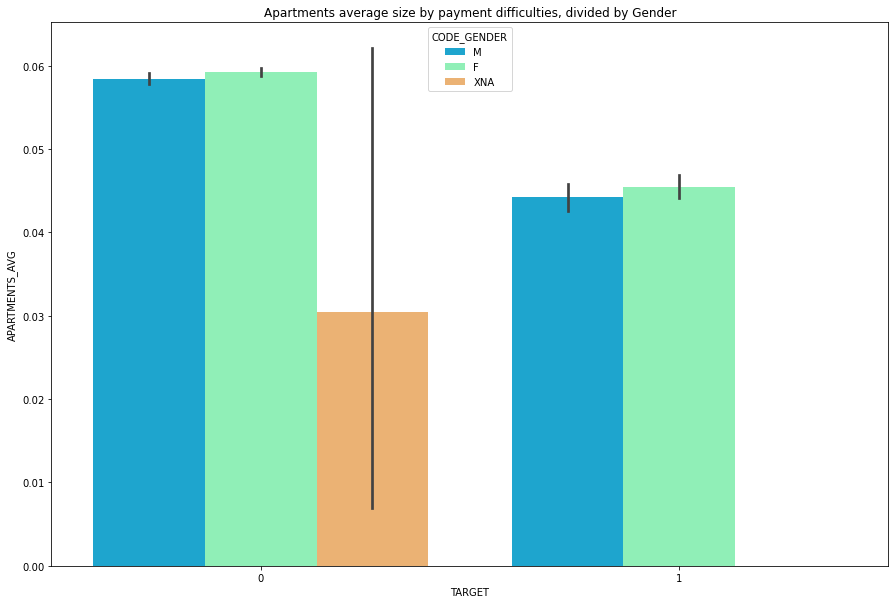

In [35]:
plt.figure(figsize=(15,10))
sns.barplot(x=tv_df['TARGET'],y=tv_df['APARTMENTS_AVG'],data=tv_df, palette='rainbow', hue='CODE_GENDER')
plt.title("Apartments average size by payment difficulties, divided by Gender")

Text(0.5, 1.0, 'Income by payment difficulties, divided by gender')

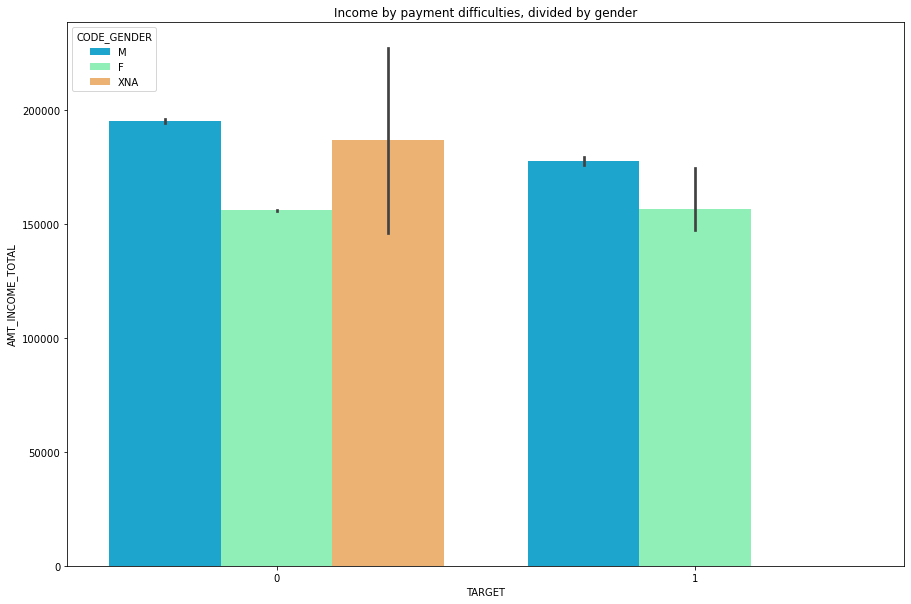

In [36]:
plt.figure(figsize=(15,10))
sns.barplot(x=tv_df['TARGET'],y=tv_df['AMT_INCOME_TOTAL'],data=tv_df, palette='rainbow', hue='CODE_GENDER')
plt.title("Income by payment difficulties, divided by gender")

# Week 2 Assignment

### a) Build a classification tree using Python. Only use the top-ten variables you chose in Module 1 Assignment as the most relevant to creating a predictive model from the default-risk data. Prune the tree if necessary. Plot the tree visualization.

In [338]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation


In [339]:
df = df[['TARGET','NAME_HOUSING_TYPE', 'CNT_CHILDREN','NAME_TYPE_SUITE','NAME_FAMILY_STATUS','REGION_POPULATION_RELATIVE','CODE_GENDER','DAYS_EMPLOYED','OCCUPATION_TYPE','APARTMENTS_AVG','AMT_INCOME_TOTAL']]
df.dropna()
df.fillna(0, inplace = True)
df.head()

,TARGET,NAME_HOUSING_TYPE,CNT_CHILDREN,NAME_TYPE_SUITE,NAME_FAMILY_STATUS,REGION_POPULATION_RELATIVE,CODE_GENDER,DAYS_EMPLOYED,OCCUPATION_TYPE,APARTMENTS_AVG,AMT_INCOME_TOTAL
0,1,House / apartment,0,Unaccompanied,Single / not married,0.018801,M,-637,Laborers,0.0247,202500.0
1,0,House / apartment,0,Family,Married,0.003541,F,-1188,Core staff,0.0959,270000.0
2,0,House / apartment,0,Unaccompanied,Single / not married,0.010032,M,-225,Laborers,0.0000,67500.0
3,0,House / apartment,0,Unaccompanied,Civil marriage,0.008019,F,-3039,Laborers,0.0000,135000.0
4,0,House / apartment,0,Unaccompanied,Single / not married,0.028663,M,-3038,Core staff,0.0000,121500.0


In [349]:
from sklearn.model_selection import train_test_split
from sklearn import tree

feature = df[['CNT_CHILDREN','REGION_POPULATION_RELATIVE','DAYS_EMPLOYED','APARTMENTS_AVG','AMT_INCOME_TOTAL']]
x = feature
y = df['TARGET']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)
x.head()

,CNT_CHILDREN,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,APARTMENTS_AVG,AMT_INCOME_TOTAL
0,0,0.018801,-637,0.0247,202500.0
1,0,0.003541,-1188,0.0959,270000.0
2,0,0.010032,-225,0.0000,67500.0
3,0,0.008019,-3039,0.0000,135000.0
4,0,0.028663,-3038,0.0000,121500.0


In [359]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion='entropy', random_state=1234)

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8520714548962647


In [360]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8520714548962647


In [ ]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import pydotplus
from io import StringIO
import sklearn.tree
from sklearn.tree import export_graphviz
import graphviz

dot_data = StringIO()
tree.export_graphviz(clf,out_file = dot_data,feature_names= x.columns,class_names = ['difficulty paying','Other cases'],
                   filled = True,
                   )
g = pydotplus.graph_from_dot_data(dot_data.getvalue()
                                 )
g.write_png('mlpr_1002.png')
from IPython.display import Image
Image(g.create_png())

In [143]:
text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_2 <= -2422.50
|   |--- feature_2 <= -4018.50
|   |   |--- feature_3 <= 0.03
|   |   |   |--- feature_2 <= -5443.50
|   |   |   |   |--- feature_1 <= 0.00
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_1 >  0.00
|   |   |   |   |   |--- feature_4 <= 221625.00
|   |   |   |   |   |   |--- feature_2 <= -12271.00
|   |   |   |   |   |   |   |--- feature_0 <= 0.50
|   |   |   |   |   |   |   |   |--- feature_2 <= -14056.00
|   |   |   |   |   |   |   |   |   |--- feature_2 <= -14072.00
|   |   |   |   |   |   |   |   |   |   |--- feature_4 <= 196425.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |   |--- feature_4 >  196425.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |   |   |--- feature_2 >  -14072.00
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- feature_2 >  -14056.00
|   |   |   |   |

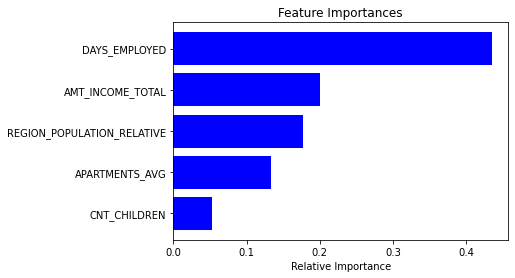

In [144]:
features = feature
importances = clf.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### B) Build a Random Forest and plot the variable importance chart from the Random Forest. Are the top-ten variables the same as ones you chose before? Explain any differences that you observe.

In [159]:
df = pd.read_csv('application_train.csv')
df.dropna(0,inplace = True)
df.head()


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
71,100083,0,Cash loans,M,Y,Y,0,103500.0,573628.5,24435.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
124,100145,0,Cash loans,F,Y,Y,1,202500.0,260725.5,16789.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
152,100179,0,Cash loans,F,Y,N,0,202500.0,675000.0,53329.5,...,0,0,0,0,0.0,0.0,0.0,1.0,0.0,4.0
161,100190,0,Cash loans,M,Y,N,0,162000.0,263686.5,24781.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
255,100295,1,Cash loans,M,Y,N,1,225000.0,1019205.0,31032.0,...,1,0,0,0,0.0,0.0,0.0,6.0,0.0,1.0


In [160]:
from sklearn.ensemble import RandomForestClassifier

In [192]:
clf = RandomForestClassifier(n_estimators = 100) 
 
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(x_train, y_train)
 
# performing predictions on the test dataset
y_pred = clf.predict(x_test)
 
# metrics are used to find accuracy or error
from sklearn import metrics 
print()
 
# using metrics module for accuracy calculation
print("ACCURACY OF THE MODEL: ", metrics.accuracy_score(y_test, y_pred))


ACCURACY OF THE MODEL:  0.9407206509104998


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import tree
x = df.drop(['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR','FLAG_OWN_REALTY','NAME_TYPE_SUITE','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE','OCCUPATION_TYPE',
             'WEEKDAY_APPR_PROCESS_START','ORGANIZATION_TYPE','FONDKAPREMONT_MODE','HOUSETYPE_MODE','WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'], axis = 1)
y = df['TARGET']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)


In [177]:
features= ['SK_ID_CURR', 'CNT_CHILDREN','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','REGION_POPULATION_RELATIVE','DAYS_BIRTH','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21','AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY',
          'AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR','DAYS_ID_PUBLISH','OWN_CAR_AGE','FLAG_MOBIL',
           'FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL','CNT_FAM_MEMBERS',
           'REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY','WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START',
           'REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY',
           'REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3'
           'APARTMENTS_AVG','BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG','COMMONAREA_AVG',
           'ELEVATORS_AVG','ENTRANCES_AVG','FLOORSMAX_AVG','FLOORSMIN_AVG','LANDAREA_AVG','LIVINGAPARTMENTS_AVG',
           'LIVINGAREA_AVG','NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG','APARTMENTS_MODE','BASEMENTAREA_MODE',
           'YEARS_BEGINEXPLUATATION_MODE','YEARS_BUILD_MODE','COMMONAREA_MODE','ELEVATORS_MODE','ENTRANCES_MODE',
           'FLOORSMAX_MODE','FLOORSMIN_MODE','LANDAREA_MODE','LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE',
           'NONLIVINGAREA_MODE','APARTMENTS_MEDI','BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI','COMMONAREA_MEDI',
           'ELEVATORS_MEDI','ENTRANCES_MEDI','FLOORSMAX_MEDI',
           'FLOORSMIN_MEDI','LANDAREA_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI',
           'NONLIVINGAREA_MEDI','FONDKAPREMONT_MODE','HOUSETYPE_MODE','TOTALAREA_MODE','WALLSMATERIAL_MODE',
           'OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_2','FLAG_DOCUMENT_3',
           'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9',
           'FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17'
          ]

In [179]:
rnd_clf = RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=42)
rnd_clf.fit(x, y)
for name, importance in zip(features, rnd_clf.feature_importances_):
    print(name, "=", importance)

SK_ID_CURR = 0.024897741802233926
CNT_CHILDREN = 0.004282304294999753
AMT_INCOME_TOTAL = 0.01704149208323869
AMT_CREDIT = 0.021168891120156713
AMT_ANNUITY = 0.021462042181211196
AMT_GOODS_PRICE = 0.017084861773449558
REGION_POPULATION_RELATIVE = 0.015116809574186913
DAYS_BIRTH = 0.02500984927986117
DAYS_BIRTH = 0.024346596353949323
DAYS_EMPLOYED = 0.02609686523530326
DAYS_REGISTRATION = 0.022172933521942436
FLAG_DOCUMENT_18 = 0.017029710414778187
FLAG_DOCUMENT_19 = 0.0
FLAG_DOCUMENT_20 = 0.0
FLAG_DOCUMENT_21 = 0.0027950116880578937
AMT_REQ_CREDIT_BUREAU_HOUR = 0.0002561015031033645
AMT_REQ_CREDIT_BUREAU_DAY = 0.0027722678867113
AMT_REQ_CREDIT_BUREAU_WEEK = 0.002614224596947063
AMT_REQ_CREDIT_BUREAU_MON = 0.0064339697974571935
AMT_REQ_CREDIT_BUREAU_QRT = 0.004140690196840072
AMT_REQ_CREDIT_BUREAU_YEAR = 0.004019097225566941
DAYS_ID_PUBLISH = 0.015034245669288161
OWN_CAR_AGE = 0.0008714580896987363
FLAG_MOBIL = 0.001586818897235935
FLAG_EMP_PHONE = 0.001833291878263632
FLAG_WORK_PHONE = 

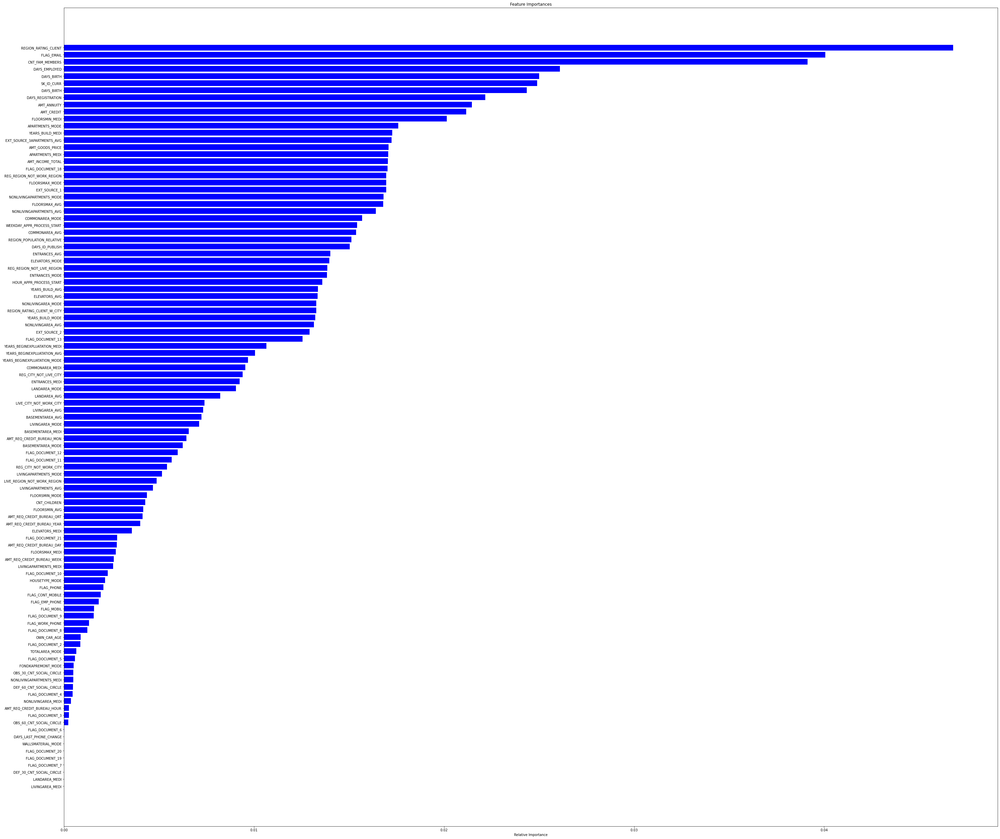

In [191]:
figsize = plt.subplots(figsize = (50, 45))

importances = rnd_clf.feature_importances_
indices = np.argsort(importances)


plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Based on the Random Forest, the top 10 variables are: Region_RATING_CLIENT, FLAG_EMAIL, CNT_FAM_MEMBERS, DAYS_EMPLOYED, DAYS_BIRTH, DAYS_REGISTRATION, AMT_ANNUITY, and AMT_CREDIT. In my original top 10, it was CNT_CHILDREN, REGION_POPULATION_RELATIVE, DAYS_EMPLOYED, APARTMENTS_AVG, and AMT_INCOME_TOTAL. The only similarity would be DAYS_EMPLOYED but other than that, the results are entirely different. This is due to using intuition rather relying on data.  

## C) Using only the top-ten variables from the variable importance plot, rebuild the random forest and the single classification tree. Plot the single tree.

In [271]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from matplotlib import pyplot as plt


In [272]:
df = pd.read_csv('application_train.csv')
df.dropna(0,inplace = True)
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
71,100083,0,Cash loans,M,Y,Y,0,103500.0,573628.5,24435.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
124,100145,0,Cash loans,F,Y,Y,1,202500.0,260725.5,16789.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
152,100179,0,Cash loans,F,Y,N,0,202500.0,675000.0,53329.5,...,0,0,0,0,0.0,0.0,0.0,1.0,0.0,4.0
161,100190,0,Cash loans,M,Y,N,0,162000.0,263686.5,24781.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
255,100295,1,Cash loans,M,Y,N,1,225000.0,1019205.0,31032.0,...,1,0,0,0,0.0,0.0,0.0,6.0,0.0,1.0


In [273]:
from sklearn.model_selection import train_test_split
from sklearn import tree

feature = df[['REGION_RATING_CLIENT', 'FLAG_EMAIL','CNT_FAM_MEMBERS', 'DAYS_EMPLOYED', 'DAYS_BIRTH', 'DAYS_REGISTRATION', 'AMT_ANNUITY', 'AMT_CREDIT']]
x = feature
y = df['TARGET']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)
x.head()



,REGION_RATING_CLIENT,FLAG_EMAIL,CNT_FAM_MEMBERS,DAYS_EMPLOYED,DAYS_BIRTH,DAYS_REGISTRATION,AMT_ANNUITY,AMT_CREDIT
71,2,0,2.0,-892,-15406,-341.0,24435.0,573628.5
124,2,0,2.0,-4375,-16282,-762.0,16789.5,260725.5
152,2,0,2.0,-2311,-11375,-180.0,53329.5,675000.0
161,2,0,2.0,-4472,-13972,-464.0,24781.5,263686.5
255,1,0,2.0,-602,-11356,-335.0,31032.0,1019205.0


In [277]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion='entropy', random_state=1234)

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8868655559860519


In [278]:
text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_3 <= -2027.50
|   |--- feature_4 <= -14887.50
|   |   |--- feature_3 <= -2308.00
|   |   |   |--- feature_3 <= -2310.50
|   |   |   |   |--- feature_5 <= -13042.50
|   |   |   |   |   |--- feature_3 <= -5830.00
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_3 >  -5830.00
|   |   |   |   |   |   |--- feature_7 <= 550980.00
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_7 >  550980.00
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_5 >  -13042.50
|   |   |   |   |   |--- feature_6 <= 68577.75
|   |   |   |   |   |   |--- feature_2 <= 3.50
|   |   |   |   |   |   |   |--- feature_4 <= -15067.50
|   |   |   |   |   |   |   |   |--- feature_4 <= -15068.50
|   |   |   |   |   |   |   |   |   |--- feature_4 <= -15440.00
|   |   |   |   |   |   |   |   |   |   |--- feature_4 <= -15574.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 22
|   |   |   |   |   |   |   |   |   |  

In [328]:
import pydotplus
from io import StringIO
import sklearn.tree
from sklearn.tree import export_graphviz
import graphviz

dot_data = StringIO()
tree.export_graphviz(clf,out_file = dot_data,feature_names= x.columns,class_names = ['difficulty paying','Other cases'],
                   filled = True,
                   )
g = pydotplus.graph_from_dot_data(dot_data.getvalue()
                                 )
g.write_png('mlpr_1002.png')
from IPython.display import Image
Image(g.create_png())

In [237]:
#RANDOM FOREST
clf = RandomForestClassifier(n_estimators = 100) 
 
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(x_train, y_train)
 
# performing predictions on the test dataset
y_pred = clf.predict(x_test)
 
# metrics are used to find accuracy or error
from sklearn import metrics 
print()
 
# using metrics module for accuracy calculation
print("ACCURACY OF THE MODEL: ", metrics.accuracy_score(y_test, y_pred))


ACCURACY OF THE MODEL:  0.9368461836497481


## D) Compare the accuracy and generalization of the two sets of classification trees and random forests. Explain if/why you see the differences.

#### As we can see, with my initial top-10 variables, all of them were chosen by intuition. The results from the classication tree was approximately 85%. When using  RandomForest, the results were approximately 94% which is hight than the decision tree. For feature importance, Based on the Random Forest, the top 10 variables are: Region_RATING_CLIENT, FLAG_EMAIL, CNT_FAM_MEMBERS, DAYS_EMPLOYED, DAYS_BIRTH, DAYS_REGISTRATION, AMT_ANNUITY, and AMT_CREDIT. In my original top 10, it was CNT_CHILDREN, REGION_POPULATION_RELATIVE, DAYS_EMPLOYED, APARTMENTS_AVG, and AMT_INCOME_TOTAL. The only similarity would be DAYS_EMPLOYED but other than that, the results are entirely different. This is due to using intuition rather relying on data. Lastly, when we used the top-ten by the random forest, we saw significant impact on the classification tree which increase to 95%. Whereas, the top-ten variables used to make another random forest were quite similar where the latter was 93.68%